## BLR Schemes

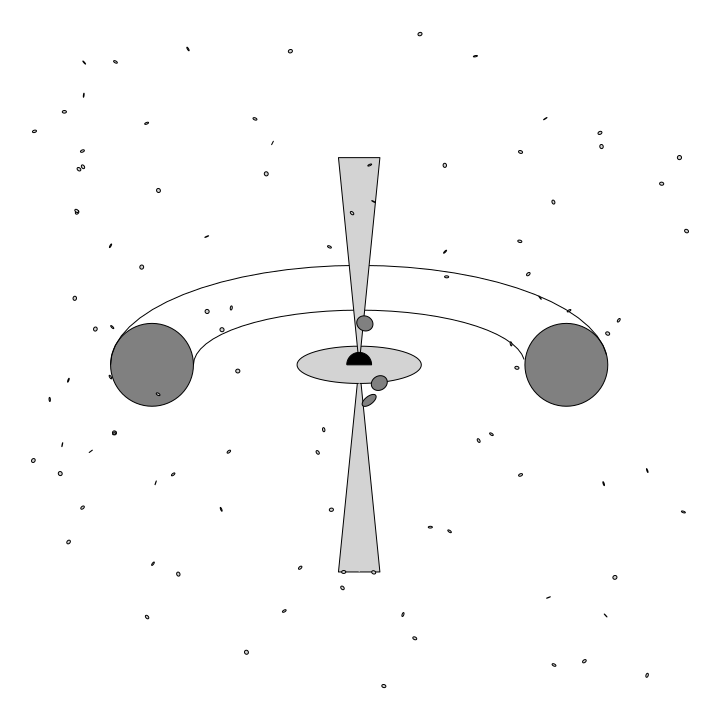

In [13]:
using Plots,Distributions

function makeCircle(c,n;squish=0.2,nθ=64,r=1,half=false)
    cx,cy = c
    circlex = [r*sin(θ)*squish for θ=0:(2π/nθ):2*π] #squish points in x direction to make ellipse
    circley = [r*cos(θ) for θ=0:(2π/nθ):2*π]
    θ = atan(n[2],n[1]) #what angle should we point at? Use passed in unit vector [1,0] means point in x, [1,1] point up 45 degrees, [0,1] point in y, etc
    wormx = [deepcopy(circlex[i])*cos(θ)-deepcopy(circley[i])*sin(θ) for i=1:length(circlex)].+cx #rotation matrix, centered on our cx and cy
    wormy = [deepcopy(circlex[i])*sin(θ)+deepcopy(circley[i])*cos(θ) for i=1:length(circley)].+cy #need to add center points at end because otherwise we rotate them too!
    halfInd = convert(Int,(length(wormx)-1)/2) #-1 because degeneracy with 0 and 2π
    return half == true ? (wormx[1:halfInd],wormy[1:halfInd]) : (wormx,wormy)
end

yOffset = 5.
#torus
p=plot(makeCircle([5,0+yOffset],[-1,0],squish=1.),aspect_ratio=:equal,fill=true,fillcolor=:gray,linecolor=:black,label="projected torus")
p=plot!(makeCircle([-5,0+yOffset],[-1,0],squish=1.),fill=true,fillcolor=:gray,linecolor=:black,label="")
p=plot!(makeCircle([0,0+yOffset],[0,1],r=6,half=true,squish=0.4),c=:black,label="")
#plot!(makeCircle([0,0.],[0,1],r=4,half=true,squish=0.4),fillrange=makeCircle([0,0.],[0,1],r=6,half=true,squish=0.4)[2],fillcolor=:lightgray)
#plot!(makeCircle([0,1],[0,1],r=5,half=true,squish=0.3))
#plot!(makeCircle([0,-1],[0,1],r=5,half=true,squish=0.3))
p=plot!(makeCircle([0,0+yOffset],[0,1],r=4,half=true,squish=0.33),c=:black,label="")
#plot bottom jet
jetPts=100;jetSlope=100;jetMax=10
yJet=[y for y=-jetPts/2:jetPts/2]./jetMax
xJetL=-1 .*abs.([x for x=-jetPts/2:jetPts/2])./jetSlope
xJetR=abs.([x for x=-jetPts/2:jetPts/2])./jetSlope
hJetx = range(minimum(xJetL),stop=maximum(xJetR),length=jetPts)
xJet = vcat(xJetL,hJetx,xJetR,hJetx) #define entire shape
yJet = vcat(yJet,ones(jetPts).*maximum(yJet),reverse(yJet),ones(jetPts).*minimum(yJet))
# p=plot!(xJetL,yJet,linecolor=:black,label="jet")
# p=plot!(xJetR,yJet,linecolor=:black,label="")
topMask = yJet .> 0; bottomMask = yJet .<= 0
p = plot!(xJet[bottomMask],yJet[bottomMask].+yOffset,linecolor=:black,fill=true,fillcolor=:lightgray,label="jet")
#thin (inner) disk (cutaway commented out)
xdisk,ydisk=makeCircle([0,0+yOffset],[0,1],squish=0.3,r=1.5,half=false)
# xdisk=vcat(xdisk,range(maximum(xdisk),stop=minimum(xdisk),length=10))
# ydisk=vcat(ydisk,ones(10).*minimum(ydisk))
p=plot!(xdisk,ydisk,linecolor=:black,fill=true,fillcolor=:lightgray,label="inner disk")
#plot top jet
p = plot!(xJet[topMask],yJet[topMask].+yOffset,linecolor=:black,fill=true,fillcolor=:lightgray,label="")
#SMBH
xtmp,ytmp=makeCircle([0,0+yOffset],[0,1],squish=1.,r=0.3,half=true)
xSMBH = vcat(xtmp,range(maximum(xtmp),minimum(xtmp),length=100))
ySMBH = vcat(ytmp,ones(100).*minimum(ytmp))
p=plot!(xSMBH,ySMBH,fill=true,fillcolor=:black,linecolor=:black,label="SMBH")

#BLR/NLR clouds
for i=1:100 #clouds
    xc,yc = rand(Uniform(-8,8),2)
    #yc = rand(Uniform(-5,5))
    p=plot!(makeCircle([xc,yc+yOffset],rand(Uniform(-1,1),2),r=(abs(yc) < 1.5) & (abs(xc) < 2.5) ? :0.2 : :0.05,squish=rand()),fill=true,linecolor=:black,fillcolor= (abs(yc) < 1.5) & (abs(xc) < 2.5) ? :gray : :lightgray,label = i==1 ? "clouds" : "")
end
p=plot!(legend=false,xaxis=false,grid=false,yaxis=false,xticks=false,yticks=false,size=(720,720))
savefig("cloudSchematic.svg")
display(p)

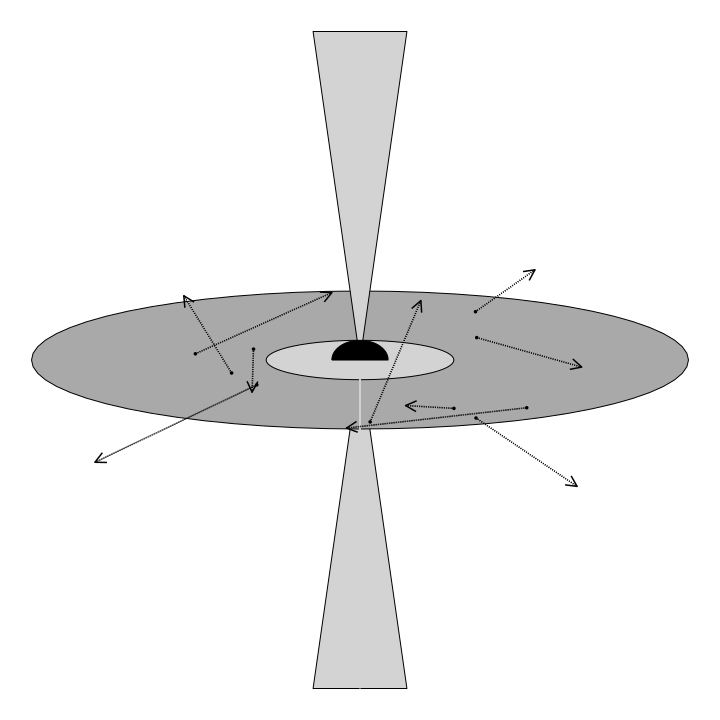

In [130]:
#now making my model picyOffset = 5.
#torus
# p=plot(makeCircle([5,0+yOffset],[-1,0],squish=1.),aspect_ratio=:equal,fill=true,fillcolor=:gray,linecolor=:black,label="projected torus")
# p=plot!(makeCircle([-5,0+yOffset],[-1,0],squish=1.),fill=true,fillcolor=:gray,linecolor=:black,label="")
# p=plot!(makeCircle([0,0+yOffset],[0,1],r=6,half=true,squish=0.4),c=:black,label="")
# #plot!(makeCircle([0,0.],[0,1],r=4,half=true,squish=0.4),fillrange=makeCircle([0,0.],[0,1],r=6,half=true,squish=0.4)[2],fillcolor=:lightgray)
# #plot!(makeCircle([0,1],[0,1],r=5,half=true,squish=0.3))
# #plot!(makeCircle([0,-1],[0,1],r=5,half=true,squish=0.3))
# p=plot!(makeCircle([0,0+yOffset],[0,1],r=4,half=true,squish=0.33),c=:black,label="")

#plot bottom jet
jetPts=100;jetSlope=100;jetMax=10
yJet=[y for y=-jetPts/2:jetPts/2]./jetMax
xJetL=-1 .*abs.([x for x=-jetPts/2:jetPts/2])./jetSlope
xJetR=abs.([x for x=-jetPts/2:jetPts/2])./jetSlope
hJetx = range(minimum(xJetL),stop=maximum(xJetR),length=jetPts)
xJet = vcat(xJetL,hJetx,xJetR,hJetx) #define entire shape
yJet = vcat(yJet,ones(jetPts).*maximum(yJet),reverse(yJet),ones(jetPts).*minimum(yJet))
# p=plot!(xJetL,yJet,linecolor=:black,label="jet")
# p=plot!(xJetR,yJet,linecolor=:black,label="")
topMask = yJet .> 0; bottomMask = yJet .<= 0
p = plot(xJet[bottomMask],yJet[bottomMask].+yOffset,linecolor=:black,fill=true,fillcolor=:lightgray,label="jet")

#full disk
xdiskBLR,ydiskBLR=makeCircle([0,0+yOffset],[0,1],squish=0.3,r=3.5,half=false)
p=plot!(xdiskBLR,ydiskBLR,linecolor=:black,fill=true,fillcolor=:darkgray,label="BLR disk")

#thin (inner) disk (cutaway commented out)
xdisk,ydisk=makeCircle([0,0+yOffset],[0,1],squish=0.3,r=1.,half=false)
# xdisk=vcat(xdisk,range(maximum(xdisk),stop=minimum(xdisk),length=10))
# ydisk=vcat(ydisk,ones(10).*minimum(ydisk))
p=plot!(xdisk,ydisk,linecolor=:black,fill=true,fillcolor=:lightgray,label="inner disk")

#plot top jet
p = plot!(xJet[topMask],yJet[topMask].+yOffset,linecolor=:black,fill=true,fillcolor=:lightgray,label="")

#SMBH
xtmp,ytmp=makeCircle([0,0+yOffset],[0,1],squish=1.,r=0.3,half=true)
xSMBH = vcat(xtmp,range(maximum(xtmp),minimum(xtmp),length=100))
ySMBH = vcat(ytmp,ones(100).*minimum(ytmp))
p=plot!(xSMBH,ySMBH,fill=true,fillcolor=:black,linecolor=:black,label="SMBH")
p=plot!(legend=false,xaxis=false,grid=false,yaxis=false,xticks=false,yticks=false,size=(720,720))

#WIND
windlines = 10
for i=1:windlines
    randi = rand(1:length(xdiskBLR))
    xf,yf=nothing,nothing
    if xdisk[randi] < xdiskBLR[randi]
        xf = rand(Uniform(xdisk[randi],xdiskBLR[randi])) #random footpoint for wind
    elseif xdisk[randi] > xdiskBLR[randi]
        xf = rand(Uniform(xdiskBLR[randi],xdisk[randi])) #random footpoint for wind
    else 
        xf = xdisk[randi]
    end
    if ydisk[randi] < ydiskBLR[randi]
        yf = rand(Uniform(ydisk[randi],ydiskBLR[randi]))
    elseif ydisk[randi] > ydiskBLR[randi]
        yf = rand(Uniform(ydiskBLR[randi],ydisk[randi]))
    else
        yf = ydisk[randi]
    end
    xend = xf + rand(Uniform(-2,2))
    yend = yf + rand(Uniform(-2,2))
    p = scatter!([xf],[yf],label="",markercolor=:black,markersize=2)
    p = plot!([xf,xend],[yf,yend],linecolor=:black,linestyle=:dot,label="",arrow=true,lw=1.5)
end

# for i=1:100 #clouds
#     xc,yc = rand(Uniform(-8,8),2)
#     #yc = rand(Uniform(-5,5))
#     p=plot!(makeCircle([xc,yc+yOffset],rand(Uniform(-1,1),2),r=(abs(yc) < 1.5) & (abs(xc) < 2.5) ? :0.0 : :0.05,squish=rand()),fill=true,linecolor=:black,fillcolor= (abs(yc) < 1.5) & (abs(xc) < 2.5) ? :gray : :lightgray,label = i==1 ? "clouds" : "")
# end
savefig("diskWindSchematic.svg")
display(p)

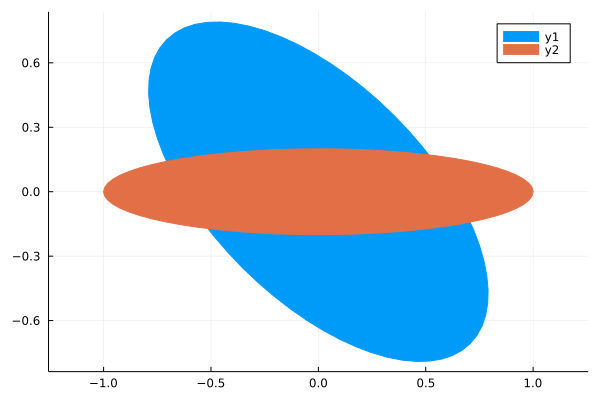

In [45]:
plot(makeCircle([0,0],[1,1],squish=0.5),aspect_ratio=:equal,fill=true)
plot!(makeCircle([0,0],[0,1],squish=0.2),fill=true)

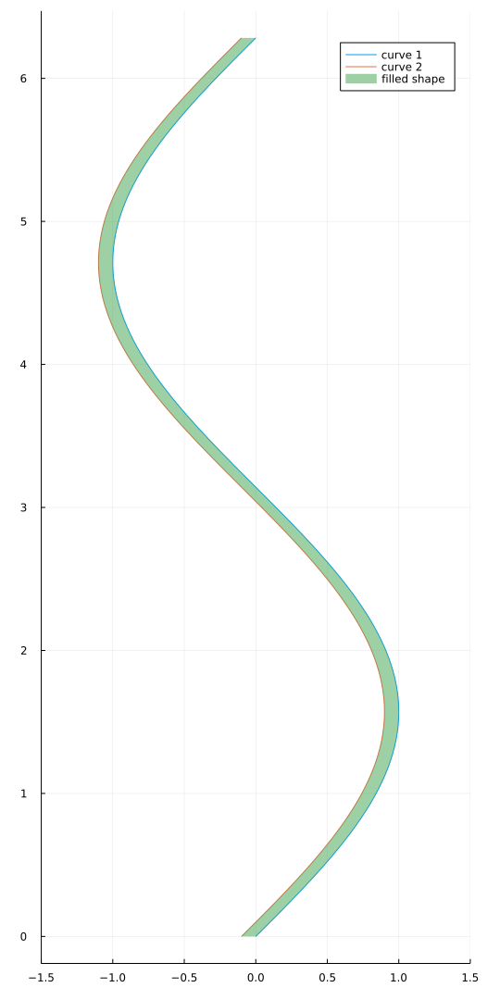

In [278]:
x=collect(0:π/64:2π)
y=sin.(x)
y2=sin.(x).-0.1
plot(y,x,label="curve 1")
plot!(y2,x,label="curve 2")
shapex = vcat(x,[x[end],x[end]],reverse(x),[x[1],x[1]])
shapey = vcat(y,[y[end],y2[end]],reverse(y2),[y2[1],y[1]])
plot!(shapey,shapex,fill=true,label="filled shape",linewidth=0.,fillalpha=0.5,aspect_ratio=:equal,xlims=(-1.5,1.5),size=(540,1080))

## 2. spinning star/disk LP graphic

In [2]:
#making star graphic
function get_vProj(;ω=15/180*π/(3600*24),rMin=0,rMax=7e8,i=90.,n=100,kepler=false,star=true,Mfac=0.02)
    #ω/=sin(i/180*π)
    x = range(-rMax,stop=rMax,length=n) #plot coords
    y = range(-rMax,stop=rMax,length=n)
    if star == false
        y = collect(y).*cos(i/180*π)
    end
    v_proj = zeros(length(x),length(y))
    for ix=1:length(x)
        for jx=1:length(y)
            R = star == false ? sqrt(x[ix]^2+(y[jx]/cos(i/180*π))^2) : sqrt(x[ix]^2+(y[jx])^2)
            if R<=rMax && R>=rMin 
                if kepler == false
                    θ=asin(y[jx]/rMax); sinϕ=(x[ix]/rMax)
                    v_proj[ix,jx] = rMax*cos(θ)*ω*sinϕ*sin(i/180*π)#R*cosθ gives moment arm projected along line of sight, v=ωr but then we only want v_proj so *sinϕ to get directionality  "out of page"
                else
                    ϕ=atan(x[ix],y[jx])-π/2
                    G=6.67e-11; M=2e30*Mfac
                    vk = sqrt(G*M/R)
                    v_proj[ix,jx] = vk*cos(ϕ)*sin(i/180*π)
                end
            else
                v_proj[ix,jx] = NaN
            end
        end
    end
    return x,y,v_proj
end

get_vProj (generic function with 1 method)

In [104]:
default(fontfamily="Computer Modern")
using LaTeXStrings,Printf
fontFac=1.5
function makePlot(;i,ωfac,n,kepler,star,rMin,Mfac,sampleMin=-0.1e13,sampleMax=0.1e13,sampleN=1000,T=6e3)
    Rsun=7e8; c=palette([:darkblue,:dodgerblue,:white,:crimson,:darkred],60); ν0=2.5e15
    
    x,y,v_proj = get_vProj(n=n,i=i,rMin=rMin,ω=15/180*π/(3600*24)*ωfac,kepler=kepler,star=star,Mfac=Mfac)
    #v_proj = v_proj .* sin(i/180*π) #idk why doing it here is better?
    p1=contour(x./Rsun,y./Rsun,v_proj'./1e3,aspect_ratio=:equal,fill=(true,c),
        colorbar_title="velocity [km/s]",xlabel=L"x\ [\textrm{arbitrary}]",ylabel=L"y\ [\textrm{arbitrary}]",size=(720,720),fontfamily="Computer Modern",levels=60,
        title="Velocity map",titlefont="Computer Modern",guidefont="Computer Modern",tickfont="Computer Modern",legendfontfamily="Computer Modern",
        ylims=(-1.1,1.1),xlims=(-1.1,1.1),tickdirection=:out,minorticks=true,clims=(sampleMin/ν0*(3e8/1e3),sampleMax/ν0*(3e8/1e3)),framestyle=:box,foreground_color_border=:white)


    function ϕD(ν,ν0,T)
        Δν=ν0/3e8*sqrt(2*1.38e-23*T/1.67e-27) #H
        return exp(-(ν-ν0)^2/Δν^2)/(Δν*√π)
    end

    function getLP(νSample,v_proj;ν0=2.5e15,T=6e3)
        νact=ν0.*(1 .+ filter(!isnan,v_proj)./3e8)
        LP = zeros(length(νSample))
        for ν in νact
            LP .+= ϕD.(νSample,ν,T)
        end
        return LP
    end

    νSample=range(sampleMin,stop=sampleMax,length=sampleN).+ν0
    x=νSample.-ν0
    LP = getLP(νSample,v_proj,ν0=ν0)
    p2=plot(x./ν0*(3e8/1e3),LP./maximum(LP),lw=6,line_z=x,color=c,label="Observed",cbar=false)
    p2=plot!(x./ν0*(3e8/1e3),ϕD.(νSample,ν0,T)./maximum(ϕD.(νSample,ν0,T)),color=:white,label="Reference",linestyle=:dot,lw=3)
    p2=plot!(title="Line profiles",xlabel="velocity [km/s]",ylabel="Normalized flux",fontfamily="Computer Modern",titlefont="Computer Modern",
        guidefont="Computer Modern",tickfont="Computer Modern",legendfontfamily="Computer Modern",size=(720,720),tickdirection=:out,legend=false,
        minorticks=true,framestyle=:box,foreground_color_border=:white,background_color_legend=:transparent)
    
    #making empty middle "legend" plot
    p22 = plot(grid=false,foreground_color_subplot=:black,axes=false,ticks=false,framestyle=:none,xlims=(0,1),ylims=(0,1),legend=false)
    xtmp = range(0,stop=0.3,length=60)
    ytmp = ones(length(xtmp)).*0.1
    p22=plot!(xtmp,ytmp.+0.1,line_z=xtmp,lw=6,color=c,label="",cbar=false)
    p22=plot!(xtmp,ytmp,color=:white,label="",linestyle=:dot,lw=3)
    p22=annotate!(0.35,0.2,text("Observed","Computer Modern",pointsize=10*fontFac,:white,:left))
    p22=annotate!(0.35,0.1,text("Reference","Computer Modern",pointsize=10*fontFac,:white,:left))
    LString = latexstring(L"i = %$(round(i,sigdigits=3))^\circ") #@sprintf("%.2d",ωfac)
    p22=annotate!(0.,0.65,text(LString,"Computer Modern",pointsize=10*fontFac,:white,:left))
    if kepler == false
        LString = latexstring(L"\omega = %$(round(ωfac,sigdigits=3)) \omega_0") #@sprintf("%.2d",ωfac)
        p22=annotate!(0.,0.85,text(LString,"Computer Modern",pointsize=10*fontFac,:white,:left))
    else
        LString = latexstring(L"\omega = \frac{\sqrt{G(%$(round(Mfac*100,sigdigits=3))M_0)}}{r^{3/2}}") #@sprintf("%.2d",ωfac)
        p22=annotate!(0.,0.85,text(LString,"Computer Modern",pointsize=10*fontFac,:white,:left))
    end
    
    layout = @layout([a{0.38w} b{0.15w} c{0.47w}])
    P=plot(p2,p22,p1,layout=layout,size=(1200,400),margins=3*Plots.Measures.mm,background_color=:black,fontcolor=:white,foreground_color_text=:white,gridalpha=0.3,
            y_foreground_color_axis=:white,foreground_color_border=:white,foreground_color_guide=:white,foreground_color_legend=:transparent,x_foreground_color_axis=:white,
            guidefontsize=12*fontFac,tickfontsize=8*fontFac,titlefontsize=14*fontFac,bottom_margin=9*Plots.Measures.mm,left_margin=6.5*Plots.Measures.mm,right_margin=0*Plots.Measures.mm)
    return P
end

makePlot (generic function with 1 method)

In [105]:
#TO-DO make anim
ωRange=range(1,stop=30,length=66) #2s
p=makePlot(i=75,ωfac=ωRange[1],n=500,kepler=true,star=false,rMin=3e8,Mfac=0.01)
savefig(p,"test.svg")

┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020


In [109]:
#make anim
#step 1: star rotating up to ω = 20ω0
frameNum=1
ωRange=range(1,stop=30,length=66) #2s
p=makePlot(i=90.,ωfac=0,n=500,kepler=false,star=true,rMin=0,Mfac=0.02)
savefig(p,@sprintf("tmpPlots/frame_%06d.svg",frameNum))
println("spinning up star\n")
for ω in ωRange
    frameNum+=1
    p=makePlot(i=90.,ωfac=ω,n=500,kepler=false,star=true,rMin=0,Mfac=0.02)
    savefig(p,@sprintf("tmpPlots/frame_%06d.svg",frameNum))
    print("$(@sprintf("%.2f",frameNum/length(ωRange)*100)) % complete\r") #output percent tracker
end
println("changing to i = 0\n")
#step 2: rotate the star down to i = 0
iRange=range(90,stop=0,length=33) #1s
for i in iRange
    frameNum+=1
    p=makePlot(i=i,ωfac=ωRange[end],n=500,kepler=false,star=true,rMin=0,Mfac=0.02)
    savefig(p,@sprintf("tmpPlots/frame_%06d.svg",frameNum))
    print("$(@sprintf("%.2f",frameNum/(length(iRange)+length(ωRange))*100)) % complete\r") #output percent tracker
end
println("disk changing to i = 75\n")
#step 3: cutout star, rotate back
iRange=range(0,stop=75,length=33) #1s
for i in iRange
    frameNum+=1
    p=makePlot(i=i,ωfac=ωRange[end],n=500,kepler=false,star=false,rMin=2e8,Mfac=0.02)
    savefig(p,@sprintf("tmpPlots/frame_%06d.svg",frameNum))
    print("$(@sprintf("%.2f",frameNum/(2*length(iRange)+length(ωRange))*100)) % complete\r") #output percent tracker
end
println("Keplerian disk rotation + mass expansion \n")
#step 4: change to Keplerian rotation, increase mass
MRange=range(0.01,stop=5.,length=66) #2s
sampleMinRange=range(-0.1e13,stop=-2e13,length=20);sampleMaxRange=range(0.1e13,stop=2e13,length=20);sampleNRange=range(1000,stop=5000,length=33)
for idx=1:length(MRange)
    frameNum+=1
    sampleMin = idx > length(sampleMinRange) ? sampleMinRange[end] : sampleMinRange[idx]
    sampleMax = idx > length(sampleMaxRange) ? sampleMaxRange[end] : sampleMaxRange[idx]
    sampleN = idx > length(sampleNRange) ? sampleNRange[end] : sampleNRange[idx]
    p=makePlot(i=iRange[end],ωfac=ωRange[end],n=500,kepler=true,star=false,rMin=2e8,Mfac=MRange[idx],sampleMin=sampleMin,sampleMax=sampleMax,sampleN=trunc(Int,sampleN))
    savefig(p,@sprintf("tmpPlots/frame_%06d.svg",frameNum))
    print("$(@sprintf("%.2f",frameNum/(2*length(iRange)+length(ωRange)+length(MRange))*100)) % complete\r") #output percent tracker
end



┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020

┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020

spinning up star

changing to i = 0

disk changing to i = 75

Keplerian disk rotation + mass expansion 



┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020
┌ Warning: GR: filled contour only supported with black contour lines
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:2020

In [965]:
run(`ffmpeg -framerate 30 -i "tmpPlots/frame_%06d.png" -c:v libx264 -preset slow -coder 1 -movflags +faststart -g 15 -crf 18 -pix_fmt yuv420p -profile:v high -y -bf 2 "vMap.mp4"`)


ffmpeg version 4.1 Copyright (c) 2000-2018 the FFmpeg developers
  built with gcc 8.3.0 (GCC)
  configuration: --host-os=x86_64-pc-linux-gnu --prefix=/root/mesasdk --extra-cflags=-I/root/mesasdk/include --enable-shared --enable-gpl --enable-libx264 --x86asmexe=/root/sdk2/build/nasm_ffmpeg/bin/nasm
  avutil      configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-l

  libavcodec     58. 35.100 / 58. 54.100
  libavformat    58. 20.100 / 58. 29.100
  libavdevice    58.  5.100 / 58.  8.100
  libavfilter     7. 40.101 /  7. 57.100
  libswscale      5.  3.100 /  5.  5.100
  libswresample   3.  3.100 /  3.  5.100
  libpostproc    55.  3.100 / 55.  5.100
Input #0, image2, from 'tmpPlots/frame_%06d.png':
  Duration: 00:00:06.63, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgb24(pc), 1200x400, 30 fps, 30 tbr, 30 tbn, 30 tbc
Stream mapping:
  Stream #0:0 -> #0:0 (png (native) -> h264 (libx264))
Press [q] to stop, [?] for help
[libx264 @ 0xa277c0] using cpu capabilities: MMX2 SSE2Fast SSSE3 SSE4.2 AVX FMA3 BMI2 AVX2 AVX512
[libx264 @ 0xa277c0] profile High, level 3.1
[libx264 @ 0xa277c0] 264 - core 155 r2917 0a84d98 - H.264/MPEG-4 AVC codec - Copyleft 2003-2018 - http://www.videolan.org/x264.html - options: cabac=1 ref=5 deblock=1:0:0 analyse=0x3:0x113 me=hex subme=8 psy=1 psy_rd=1.00:0.00 mixed_ref=1 me_range=16 chroma_me=1 trellis=2 8x8dct=1

Process(`ffmpeg -framerate 30 -i tmpPlots/frame_%06d.png -c:v libx264 -preset slow -coder 1 -movflags +faststart -g 15 -crf 18 -pix_fmt yuv420p -profile:v high -y -bf 2 vMap.mp4`, ProcessExited(0))

In [244]:
#supporting inclination anim
using Printf
iRange=range(90,stop=0,length=33) #1s

function globeViz(inc)
    function makeCircleVals(r;center=[0,0],nθ=64) #makes circle values for the stars to plot
        xOffset=center[1]
        yOffset=center[2]
        θ=range(0,stop=2*π,length=nθ)
        xVals=[r*cos(i)+xOffset for i in θ]
        yVals=[r*sin(i)+yOffset for i in θ]
        return xVals,yVals
    end
    P = plot(makeCircleVals(1),aspect_ratio=:equal,label="",lw=3,color=:white,axes=false,framestyle=:none,size=(540,540),background_color=:transparent,foreground_color=:transparent)
    P = scatter!([0],[sin(inc/180*π)],label="",ms=5,markerstrokewidth=0.,color=:white)
    lat = range(-90,stop=90,length=11) #0 = equator, 90 = top, -90 = bottom
    lon = range(-180,stop=180,length=500) #-180 - 0 = one side, 0 - 180 = other, add 90 so each face doesn't overlap with 0
    xlat = [zeros(length(lon)) for l in lat]
    zlat = [zeros(length(lon)) for l in lat]
    ylat = [zeros(length(lon)) for l in lat]
    iInd=15; xslice = nothing; yslice = nothing
    dList = [zeros(length(lon)) for l in lat]
    for i=1:length(lat)
        xlat[i] = [cos(lat[i]/180*π)*cos(l/180*π) for l in lon]
        ylat[i] = [cos(lat[i]/180*π)*sin(l/180*π) for l in lon]
        zlat[i] = sin(lat[i]/180*π).*ones(length(lon))
        yPi = sin(inc/180*π).*zlat[i] .+ cos(inc/180*π).*ylat[i]
        latMin = -inc; latMax = -inc+180
        if lat[i]>=latMin && lat[i]<=latMax #+90 because we always see half a circle
            if inc>=lat[i]
                d = sqrt.(((xlat[i].-cos(lat[i]/180*π)).^2).+(yPi.-sin(lat[i]/180*π)).^2) #should be two closest points, one on each side, this is the right one
                dMinInd = argmin(d) #where is d smallest? this is where we intersect the curve
                lonMax = lon[dMinInd]
                d = sqrt.(((xlat[i].+cos(lat[i]/180*π)).^2).+(yPi.-sin(lat[i]/180*π)).^2) #should be two closest points, one on each side, this is the left one
                dMinInd = argmin(d) #where is d smallest? this is where we intersect the curve
                lonMin = lon[dMinInd]
                lonMask=nothing
                if lat[i] > 0 && lonMin>0
                    lontmp = circshift(lon,length(lon)-dMinInd)
                    xlat[i] = circshift(xlat[i],length(lon)-dMinInd)
                    yPi = circshift(yPi,length(lon)-dMinInd)
                    lonMask = (lontmp.<=lonMax) .& (lontmp.>=-180) #symmetric
                    lonMask[(lontmp.>lonMin)].= 1 #wrapping around
                else
                    lonMask = (lon.<=lonMax) .& (lon.>=lonMin) #symmetric
                end
                P = plot!(xlat[i][lonMask],yPi[lonMask],label="",color=:white)
                xslice = xlat[i][lonMask][10:20:end-10]; yslice = yPi[lonMask][10:20:end-10]
                u = [xlat[i][lonMask][j+1]-xlat[i][lonMask][j] for j=10:20:length(xlat[i][lonMask])-10]; v = [yPi[lonMask][j+1]-yPi[lonMask][j] for j=10:20:length(xlat[i][lonMask])-10]
                P = quiver!(xslice,yslice,quiver=(u,v),label="",color=:white)
            else
                P = plot!(xlat[i],yPi,label="",color=:white)
                xslice = xlat[i][10:20:end-10]; yslice = yPi[10:20:end-10]
                u = [xlat[i][j+1]-xlat[i][j] for j=10:20:length(xlat[i])-10]; v = [yPi[j+1]-yPi[j] for j=10:20:length(xlat[i])-10]
                P = quiver!(xslice,yslice,quiver=(u,v),label="",color=:white)            
            end
        end
    end
    return P
end
    
function genGlobeFrames(iRange)
    frameNum=1
    for i in iRange
        P=globeViz(i)
        savefig(P,@sprintf("tmpPlots4/frame_%03d.svg",frameNum))
        frameNum+=1
        print("$(@sprintf("%.2f",frameNum/(length(iRange))*100)) % complete\r") #output percent tracker
    end
end

genGlobeFrames(iRange)

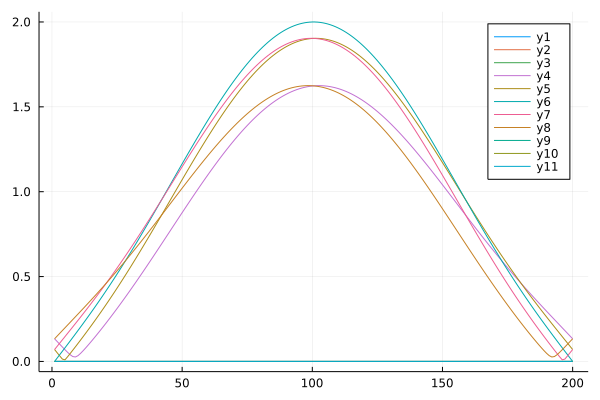

In [139]:
plot(dList)

## 3. Image manipulation

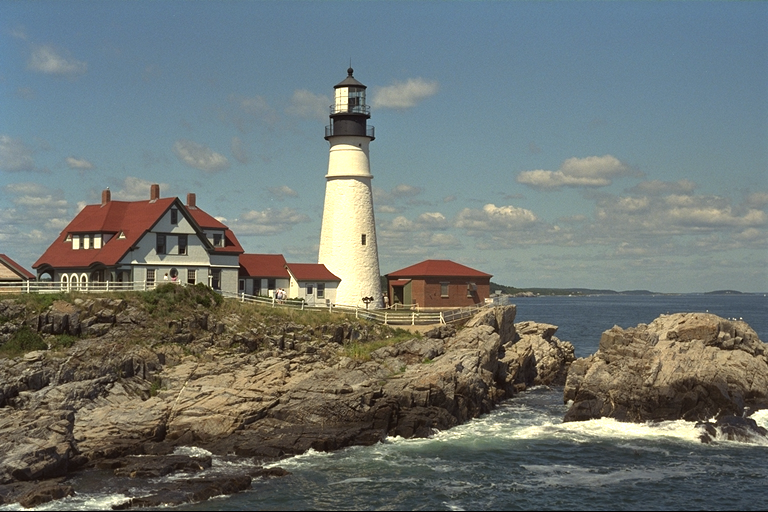

In [110]:
using Images, TestImages
img = testimage("lighthouse")

In [70]:
x=convert.(Float64,channelview(img))

3×512×768 Array{Float64, 3}:
[:, :, 1] =
 0.360784  0.360784  0.376471  0.364706  …  0.701961  0.458824  0.443137  0.0
 0.486275  0.486275  0.513725  0.498039     0.745098  0.486275  0.466667  0.0
 0.6       0.6       0.623529  0.619608     0.678431  0.447059  0.439216  0.0

[:, :, 2] =
 0.34902   0.360784  0.352941  0.368627  …  0.678431  0.427451  0.443137  0.0
 0.47451   0.498039  0.490196  0.505882     0.721569  0.466667  0.466667  0.0
 0.588235  0.607843  0.607843  0.623529     0.666667  0.423529  0.439216  0.0

[:, :, 3] =
 0.345098  0.360784  0.360784  0.364706  …  0.615686  0.513725  0.486275  0.0
 0.478431  0.494118  0.494118  0.498039     0.654902  0.552941  0.52549   0.0
 0.588235  0.615686  0.615686  0.619608     0.611765  0.517647  0.490196  0.0

;;; … 

[:, :, 766] =
 0.329412  0.356863  0.356863  0.34902   …  0.258824  0.192157  0.172549  0.0
 0.462745  0.486275  0.482353  0.47451      0.309804  0.231373  0.203922  0.0
 0.517647  0.568627  0.596078  0.588235     0.341176

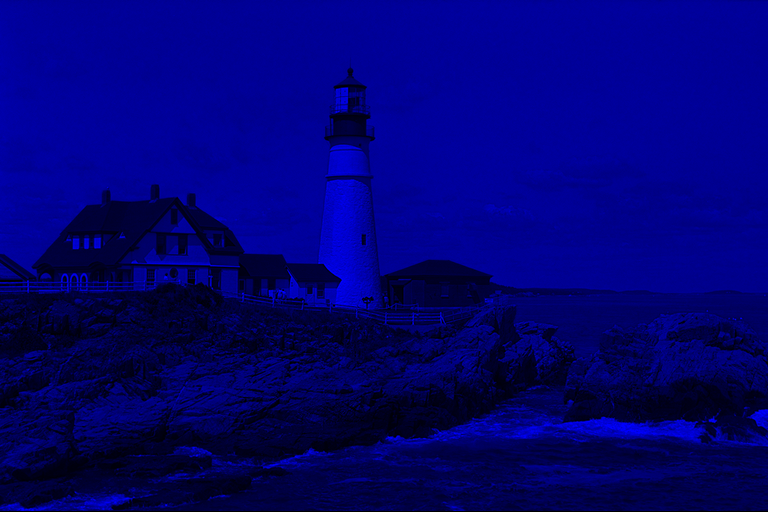

In [76]:
r = copy(x);g=copy(x);b=copy(x)
r[2:3,:,:].=0.
g[1,:,:].=0.; g[3,:,:].=0.
b[1:2,:,:].=0.
img2=colorview(RGB,b)

In [111]:
function getCentroids(img,parse=true) #assume x is an image of shape (RGB,y,x)
    x = parse == true ? convert.(Float64,channelview(img)) : img
#     crx = zeros(size(x)[3])
#     cgx = zeros(size(x)[3])
#     cbx = zeros(size(x)[3])
#     cry = zeros(size(x)[2])
#     cgy = zeros(size(x)[2])
#     cby = zeros(size(x)[2])
    crx = 0.
    cgx = 0.
    cbx = 0.
    cry = 0.
    cgy = 0.
    cby = 0.
#     for i=1:(size(x)[2])
#         cry[i] = sum(x[1,i,:])*i
#         cgy[i] = sum(x[2,i,:])*i
#         cby[i] = sum(x[3,i,:])*i
#         for j=1:(size(x)[3])
#             crx[j] = sum(x[1,:,j])*j
#             cgx[j] = sum(x[2,:,j])*j
#             cbx[j] = sum(x[3,:,j])*j
#         end
#     end
    for i=1:(size(x)[2])
        cry += sum(x[1,i,:])*i
        cgy += sum(x[2,i,:])*i
        cby += sum(x[3,i,:])*i
    end
    for j=1:(size(x)[3])
        crx += sum(x[1,:,j])*j
        cgx += sum(x[2,:,j])*j
        cbx += sum(x[3,:,j])*j
    end
    #centroids=[(sum(crx),sum(cry))./sum(vec(x[1,:,:])),(sum(cgx),sum(cgy))./sum(vec(x[2,:,:])),(sum(cbx),sum(cby))./sum(vec(x[3,:,:]))]
    cx = (crx+cgx+cbx)/(sum(vec(x[1,:,:]))+sum(vec(x[2,:,:]))+sum(vec(x[3,:,:])))
    cy = (cry+cgy+cby)/(sum(vec(x[1,:,:]))+sum(vec(x[2,:,:]))+sum(vec(x[3,:,:])))
    centroids = [(cx,cy),(crx,cry)./sum(vec(x[1,:,:])),(cgx,cgy)./sum(vec(x[2,:,:])),(cbx,cby)./sum(vec(x[3,:,:]))]
    return centroids
end

getCentroids (generic function with 2 methods)

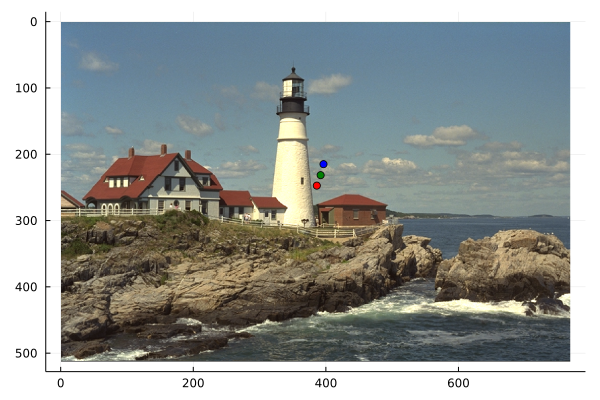

In [97]:
centroids = getCentroids(img)
p=plot(img)
colors = ["black","red","green","blue"]
for i=2:length(centroids)
    c=centroids[i]
    p=scatter!([c[1]],[c[2]],label="",color=colors[i])
end
display(p)

In [100]:
beach = load("beach.jpg")
centroids = getCentroids(beach)
p=plot(beach)
colors = ["black","red","green","blue"]
markers = [:xcross,:circle,:circle,:circle]
s = [100,40,40,40]
for i=1:length(centroids)
    c=centroids[i]
    p=scatter!([c[1]],[c[2]],label="",color=colors[i],marker=markers[i])
end
display(p)

In [112]:
#downres
using BinnedStatistics
function getBlur(img,blurFac=2,parse=true)
    x = parse == true ? convert.(Float64,channelview(img)) : img
    #res = zeros(3,convert(Int64,size(x)[2]/blurFac),convert(Int64,size(x)[3]/blurFac))
    res = copy(x)
    x1=1; y1=1; x2=blurFac; y2=blurFac
    for i=1:convert(Int64,size(res)[2]/blurFac) #y loop
        x1=1; x2 = blurFac
        for j=1:convert(Int64,size(res)[3]/blurFac) #x loop
            res[1,y1:y2,x1:x2] .= sum(x[1,y1:y2,x1:x2])/blurFac^2 #r mean
            res[2,y1:y2,x1:x2] .= sum(x[2,y1:y2,x1:x2])/blurFac^2 #g mean
            res[3,y1:y2,x1:x2] .= sum(x[3,y1:y2,x1:x2])/blurFac^2 #b mean
            x1+=blurFac;x2+=blurFac
        end
        y1+=blurFac;y2+=blurFac
    end
    return res
end

getBlur (generic function with 3 methods)

In [186]:
blur=getBlur(beach,816)

3×2448×3264 Array{Float64, 3}:
[:, :, 1] =
 0.639825  0.639825  0.639825  0.639825  …  0.787958  0.787958  0.787958
 0.689969  0.689969  0.689969  0.689969     0.681347  0.681347  0.681347
 0.715     0.715     0.715     0.715        0.539781  0.539781  0.539781

[:, :, 2] =
 0.639825  0.639825  0.639825  0.639825  …  0.787958  0.787958  0.787958
 0.689969  0.689969  0.689969  0.689969     0.681347  0.681347  0.681347
 0.715     0.715     0.715     0.715        0.539781  0.539781  0.539781

[:, :, 3] =
 0.639825  0.639825  0.639825  0.639825  …  0.787958  0.787958  0.787958
 0.689969  0.689969  0.689969  0.689969     0.681347  0.681347  0.681347
 0.715     0.715     0.715     0.715        0.539781  0.539781  0.539781

;;; … 

[:, :, 3262] =
 0.709075  0.709075  0.709075  0.709075  …  0.720946  0.720946  0.720946
 0.742236  0.742236  0.742236  0.742236     0.664685  0.664685  0.664685
 0.702116  0.702116  0.702116  0.702116     0.489322  0.489322  0.489322

[:, :, 3263] =
 0.709075  0.70

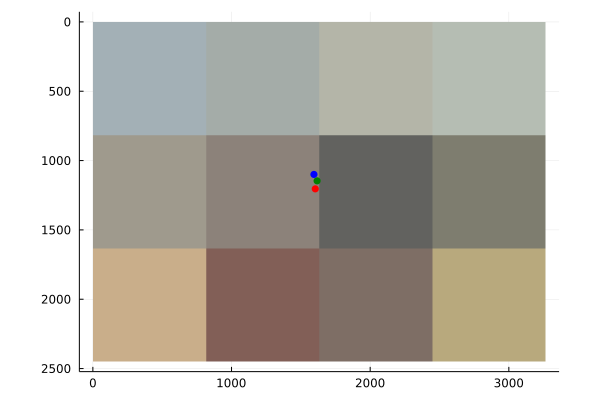

In [187]:
beach2=colorview(RGB,blur)
centroids = getCentroids(beach2)
p=plot(beach2)
colors = ["red","green","blue"]
for i=1:length(centroids)
    c=centroids[i]
    p=scatter!([c[1]],[c[2]],label="",color=colors[i],markersize=4,markerstrokewidth=0.)
end
display(p)

In [113]:
function plotFrame(img,blurFac)
    x = convert.(Float64,channelview(img))
    blur = getBlur(img,blurFac)
    centroids = getCentroids(blur,false)
    p=plot(colorview(RGB,blur))
    colors = ["black","red","green","blue"]
    markers = [:xcross,:circle,:circle,:circle]
    s = [100,40,40,40]
    swidth = [1.,0.,0.,0.]
    for i=1:length(centroids)
        c=centroids[i]
        p=scatter!([c[1]],[c[2]],label="",color=colors[i],markersize=s[i],markerstrokewidth=swidth[i],marker=markers[i])
    end
    p=plot!(title="",widen=false,tickdirection=:out,axis=false,grid=false,ticks=false,size=(size(img)[2],size(img)[1]),aspect_ratio=:equal)
    p=annotate!(50,100,text("Blur = $blurFac","Computer Modern",100,:left))
    return p
end

plotFrame (generic function with 1 method)

In [104]:
beach = load("beach.jpg")
p=plotFrame(beach,408)
png(p,"test.png")

LoadError: BoundsError: attempt to access 4-element Vector{String} at index [0]

In [203]:
p=plot!(widen=false,tickdirection=:out,axis=false,grid=false,ticks=false,size=(size(img)[2],size(img)[1]),aspect_ratio=:equal)

In [114]:
using Printf
function genFrames(img,blurLevels)
    N = length(blurLevels)
    println("generating $N frames")
    for i=1:length(blurLevels)
        blurFac = blurLevels[i]
        P = plotFrame(img,blurFac)
        print("$(@sprintf("%.2f",i/N*100)) % complete\r") #output percent tracker
        png(P,@sprintf("tmpPlots2/frame_%04d.png",i))
    end
end

genFrames (generic function with 1 method)

In [33]:
blurLevels=[2^i for i=0:4]
blurLevels=vcat(blurLevels,[51,102,204,408,816])
genFrames(beach,blurLevels)

generating 10 frames


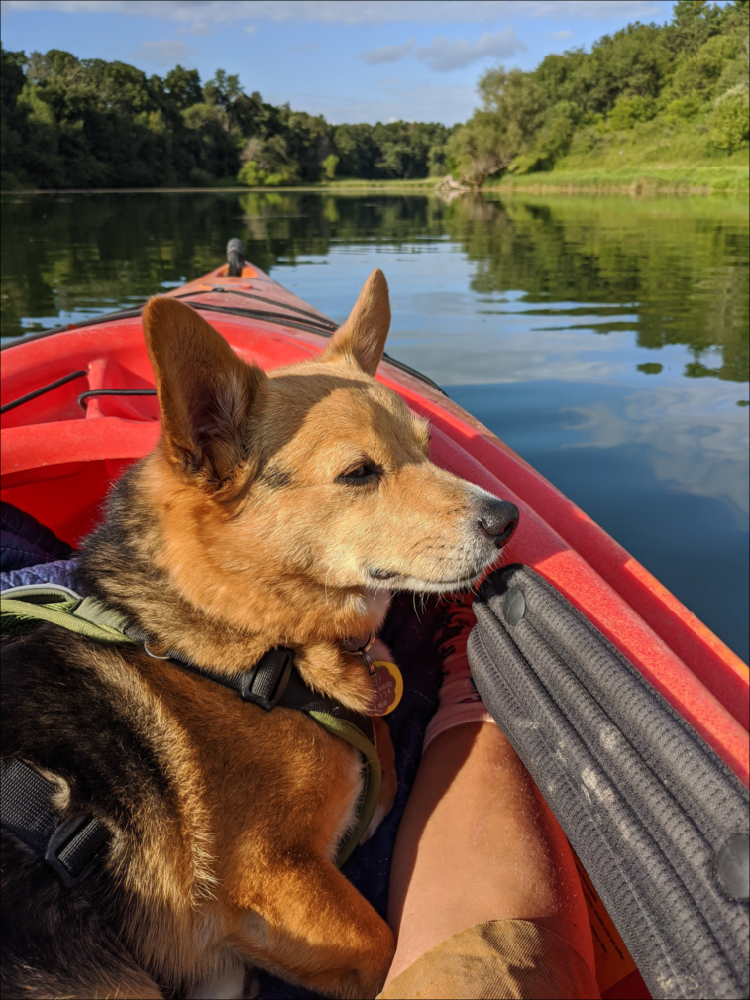

In [115]:
spud2=load("spud2.jpg")

In [108]:
p=plotFrame(spud2,1008)
png(p,"test.png")

In [109]:
blurLevels=[1,2,4,8,16,63,126,252,504,1008]
genFrames(spud2,blurLevels)

generating 10 frames


In [119]:
spudBlur = getBlur(spud2,1008)
rLP = sum(spudBlur[1,:,:]); gLP = sum(spudBlur[2,:,:]); bLP = sum(spudBlur[3,:,:])
plot([-1,0,1],[rLP,gLP,bLP]./maximum([rLP,gLP,bLP]),marker=:circle,markercolor=[:red,:green,:blue],linecolor=:black,markerstrokewidth=0.,markersize=10.,tickfontsize=12,margins=5*Plots.Measures.mm,
    size=(500,800),ylabel="Normalized flux",fontfamily="Computer Modern",xticks=([-1.,0.,1.],["Red","Green","Blue"]),label="",guidefontsize=14,title="Spud's line profile",titlefontsize=20,xlabel="Color",ylims=(0,1.1))
savefig("SpudLP.svg")

## 4. Disk->RM echo map

In [129]:
using LaTeXStrings
fontFac=1.5

function get_ring(r,i,Mfac=3e8,nθ=128)
    G=6.67e-11; M=2e30*Mfac; c=3e8; days=3600*24.
    rs = 2*G*M/c^2
    r = r*rs
    θ=range(0,stop=2π,length=nθ)
    x=r.*cos.(θ)./cos(i/180*π); y=r.*sin.(θ)
    ϕ=atan.(x,y).-π/2
    vk = sqrt(G*M/r)
    ϕ′=ϕ.+π/2
    v_proj = vk.*cos.(ϕ).*sin(i/180*π)
    t = r./(c*days).*(1 .- cos.(ϕ′)).*sin(i/180*π)
    ν = sqrt.(1 ./(2 .*(r/rs))).*sin.(ϕ′).*sin(i/180*π)
    return x./rs,y./rs,v_proj./1e6,ϕ,t,ν
end

function makeRingFrame(rList,inc,Mfac,nθ)
    LStringlabel = latexstring(L"[10^3r_s]")
    LString = latexstring(L"M_{BH} = 3\times10^8M_\odot")
    LStringTitle=latexstring(L"\textrm{Disk}\ (i=75^\circ)")
    p1 = plot(title=LStringTitle,xlabel=string("x ",LStringlabel),ylabel=string("y ",LStringlabel),colorbar_title="v [Mm/s]",aspect_ratio=:equal,clims=(-10,10),xlims=(-4e1,4e1),ylims=(-4e1,4e1))
    p1 = annotate!(0.,4.7e1,text(LString,"Computer Modern",pointsize=10*fontFac,:white,:center))
    p2 = plot(title="Echo image",cbar=false,ylims=(0,200),xlims=(-10,10),xlabel=("v [Mm/s]"),ylabel="t [days]",clims=(-10,10))
    c=palette([:darkblue,:dodgerblue,:white,:crimson,:darkred],60)
    first = true; lw=2; alpha=0.4;
    for i=1:length(rList)
        r=rList[i]
        x,y,z,ϕ,t,ν=get_ring(r,inc,Mfac,nθ)
        xlims = nothing; tlims = nothing
        if i == length(rList)
            lw = 4; alpha=1.
        end
        p1=plot!(p1,x./1e3,y./1e3,line_z=z,c=c,label="",lw=lw,alpha=alpha)
        p2=plot!(p2,ν.*(3e8/1e6),t,line_z=z,c=c,label="",lw=lw,alpha=alpha)
#         if i == length(rList) #this adjusts frame size
#             pad = (maximum(x)-minimum(x))/5
#             xlims = (minimum(x)-pad,maximum(x)+pad)
#             tlims = (0,minimum([maximum(t),200]))
#             p1 = plot!(p1,xlims=xlims)
#             p2 = plot!(p2,ylims=tlims)
#         end
    end
    p1 = plot!(p1,margins=5*Plots.Measures.mm)
    layout=@layout([a{0.4w} b{0.6w}])
    P=plot(p2,p1,layout=layout,background_color=:black,fontcolor=:white,foreground_color_text=:white,framestyle=:box,gridalpha=0.3,tickdirection=:out,
            y_foreground_color_axis=:white,foreground_color_border=:white,foreground_color_guide=:white,foreground_color_legend=:transparent,
            x_foreground_color_axis=:white,size=(1100,600),fontfamily="Computer Modern",minorticks=true,margins=5*Plots.Measures.mm,
            guidefontsize=12*fontFac,tickfontsize=8*fontFac,titlefontsize=14*fontFac)
    return P
end

function genFrames(rList,inc=75,Mfac=3e8,nθ=256)
    N = length(rList)
    for i=1:length(rList)
        P = makeRingFrame(rList[1:i],inc,Mfac,nθ)
        print("$(@sprintf("%.2f",i/N*100)) % complete\r") #output percent tracker
        savefig(P,@sprintf("tmpPlots3/frame_%04d.svg",i))
    end
end

# rList=(range(5e2,stop=7.5e3,length=100))
# makeRingFrame(rList[end-3:end],75.,3e8,256)
rList=(range(5e2,stop=7.5e3,length=150))
genFrames(rList)

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/kirk/.julia/packages/Plots/OeNV1/src/backends/gr.jl:519
┌ Warning: Multiple series with different fill alpha share a colo

# 4: new schematic

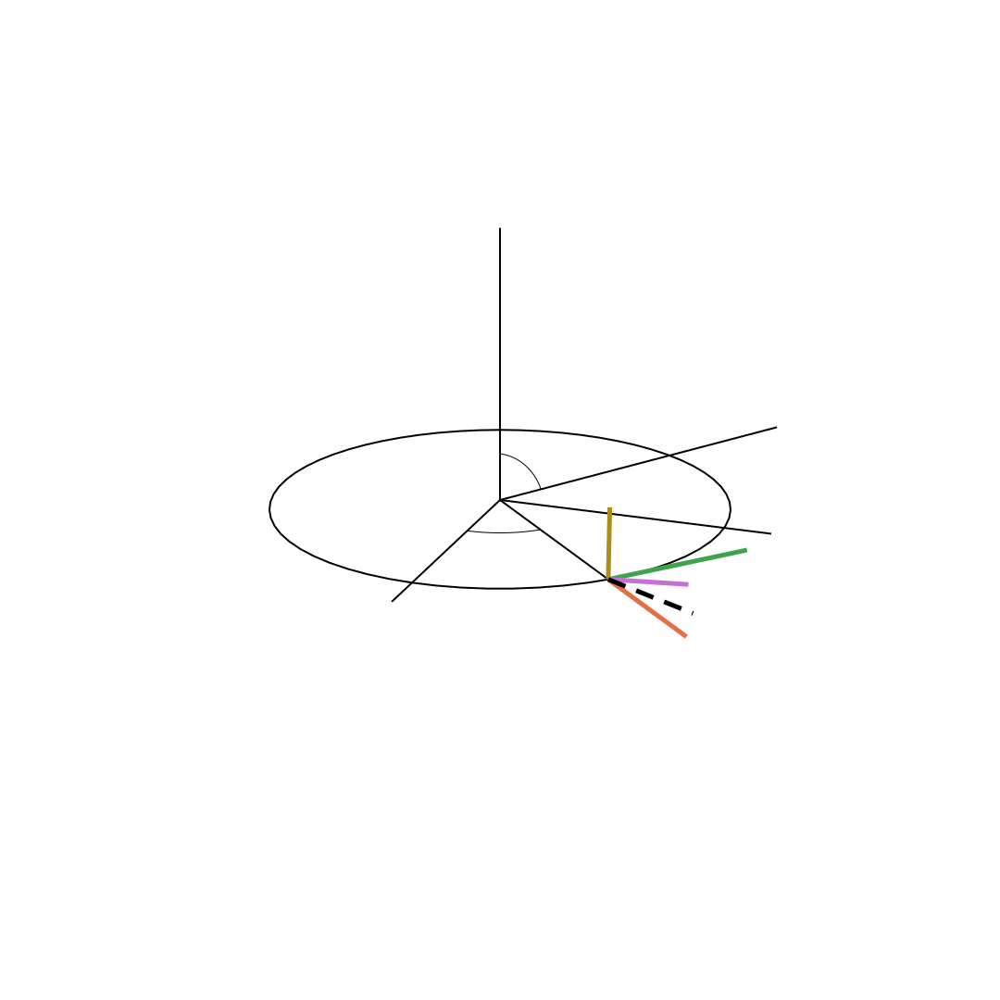

In [3]:
r = 2.5; ϕ = range(0,2π,64)
i = 20/180*π
# pre = @. sqrt(1/(2*r^3))
# f1Mag = @. pre*3*sin(i)^2*cos(ϕ)^2*sqrt(2)* #dvr/dr
# f2Mag = @. pre*3*sin(i)^2*cos(ϕ)*sin(ϕ)/2 #dvϕ/dr - vϕ/r
# f3Mag = @. pre*3*sin(i)*cos(i)*cos(ϕ) #dvθ/dr ~ dvr/dr
# f4Mag = @. pre*sqrt(2)*cos(i)^2 #1/r dvθ/dθ
xCirc = r.*cos.(ϕ); yCirc = r.*sin.(ϕ); zCirc = r.*zeros(length(ϕ))
p = plot3d(aspect_ratio=:equal,camera=(110,20),xlabel="",ylabel="",zlabel="",size=(1080,1080),axis=false,ticks=false,zlims=(-3,3),xlims=(-3,3),ylims=(-3,3),margins=0*Plots.Measures.mm)
p=plot!(xCirc,yCirc,zCirc,linecolor=:black,label="",lw=2)
#splines
xSpline = [[0,5],[0,0],[0,0]]; ySpline = [[0,0],[0,5],[0,0]]; zSpline = [[0,0],[0,0],[0,5]]
p = plot!(xSpline[1],xSpline[2],xSpline[3],label="",color=:black,lw=2)
p = plot!(ySpline[1],ySpline[2],ySpline[3],label="",color=:black,lw=2)
p = plot!(zSpline[1],zSpline[2],zSpline[3],label="",color=:black,lw=2)
#angle lines, ϕ first
ϕterms = 45/180*π; Δr = 1.5
ϕx = 0
rϕ=1
ϕangle = range(ϕx,ϕterms,32)
xϕ = [rϕ*cos(ϕi) for ϕi in ϕangle]; yϕ = [rϕ*sin(ϕi) for ϕi in ϕangle]
p = plot!(xϕ,yϕ,zeros(length(xϕ)),lw=1,label="",color=:black)
#now θ/i
θangle = range(π/2,i,32)
rϕ = 0.5
yθ = [rϕ*cos(θi) for θi in θangle]; xθ = zeros(length(θangle)); zθ = [rϕ/cos(i)*sin(θi) for θi in θangle]
p = plot!(xθ,yθ,zθ,color=:black,lw=1,label="")
p = plot!([0,0],[0,4*cos(θangle[end])],[0,4/cos(i)*sin(θangle[end])],color=:black,lw=2,label="")
#f terms
#f1 -- dvr/dr draw as radial line
p = plot!([0,r*cos(ϕterms)],[0,r*sin(ϕterms)],[0,0],label="",color=:black,lw=2) #radial line
xf1 = [r*cos(ϕterms),(r+Δr)*cos(ϕterms)]; yf1 = [r*sin(ϕterms),(r+Δr)*sin(ϕterms)]; zf1 = [0,0]
p = plot!(xf1,yf1,[0,0],label="",color=2,linewidth=5)
# f2 -- dvϕ/dr
rf = sqrt(r^2 + Δr^2); ϕf = ϕterms + Δr/r
xf2,yf2 = [r*cos(ϕterms),rf*cos(ϕf)],[r*sin(ϕterms),rf*sin(ϕf)]; zf2 = [0,0]
p = plot!(xf2,yf2,[0,0],label="",lw=5,color=3)
# f3 -- dvθ/dr
xf3 = [r*cos(ϕterms),(r+Δr)*cos(ϕterms)]; yf3 = [r*sin(ϕterms),(r+Δr)*sin(ϕterms)]; zf3 = [0,Δr*sin(i)]
p = plot!(xf3,yf3,zf3,label="",lw=5,color=4)
# f4 -- dvθ/dθ
xf4 = [r*cos(ϕterms),r*cos(ϕterms)]; yf4 = [r*sin(ϕterms),r*sin(ϕterms)]; zf4 = [0,Δr/2]
p = plot!(xf4,yf4,zf4,label="",lw=5,color=5)
#vector sum
Δx = xf1[2]+xf2[2]+xf3[2]+xf4[2]; Δy = yf1[2]+yf2[2]+yf3[2]+yf4[2]; Δz =zf1[2]+zf2[2]+zf3[2]+zf4[2]
nFac = 2/sum(Δx+Δy+Δz)
vx = [xf1[1],xf1[1]+nFac*Δx]; vy = [yf1[1],yf1[1]+nFac*Δy]; vz = [zf1[1],zf1[1]+nFac*Δz]
p = plot!(vx,vy,vz,lw=5,ls=:dash,label="",color=:black)
display(p)

In [304]:
Δz

1.263030214988503

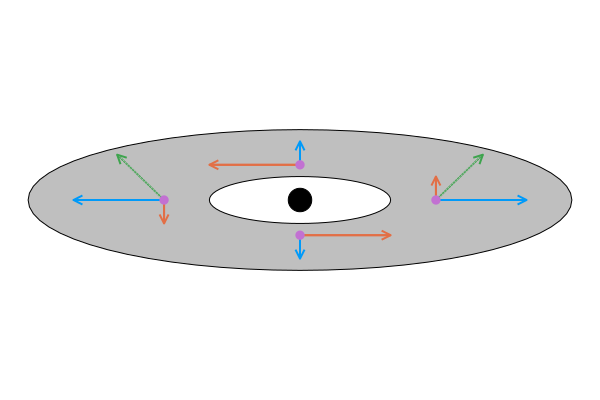

In [214]:
i=75/180*π

f1=1.;f2=1.;f3=1.;f4=1.

rMinX,rMinY=makeCircle([0,0],[1,1],squish=1)
rMaxX,rMaxY=makeCircle([0,0],[1,1],squish=1,r=3)
rMax = [rMaxX,rMaxY./cos(i)]
rMin = [rMinX,rMinY./cos(i)]
p=plot(rMaxX./cos(i),rMaxY,fill=true,fillcolor=:grey,aspect_ratio=:equal,label="",linecolor=:black,fillalpha=0.5,grid=false,
        axis=false,ticks=false)

p=plot!(rMinX./cos(i),rMinY,fill=true,fillcolor=:white,label="",linecolor=:black)
#f1 -- dvr/dr
rf = 1.5; ϕ = [0,π/2,π,3π/2]; Δr = 1
for ϕi in ϕ
    p=plot!([rf*cos(ϕi),(rf+Δr)*cos(ϕi)]./cos(i).*f1,[rf*sin(ϕi),(rf+Δr)*sin(ϕi)].*f1,label="",lw=2,arrow=true,color=1)
end
#f2 -- dvϕ/dr
for ϕi in ϕ
    xi,yi = rf*cos(ϕi),rf*sin(ϕi)
    m = yi/xi
    x2 = nothing; y2 = nothing
    if abs(m) > 1 #
        x2 =  xi - Δr*sign(sin(ϕi))
        y2 = yi
    else
        x2 = xi
        y2 = sign(sin(ϕi)) == 0 ? yi + Δr : yi - Δr*sign(sin(ϕi))
    end
    p=plot!([xi,x2]./cos(i).*f2,[yi,y2].*f2,color=2,arrow=true,lw=2,label="")
end


#f3 -- dvθ/dr
#ϕ=0
p=plot!([rf*cos(ϕ[1]),rf*cos(ϕ[1])+2*Δr*cos(i)]./cos(i).*f1,[rf*sin(ϕ[1]),2*Δr*sin(i)].*f3,lw=2,color=3,label="",arrow=true,ls=:dot)
#ϕ=π/2
p=plot!([rf*cos(ϕ[3]),rf*cos(ϕ[3])-2*Δr*cos(i)]./cos(i).*f2,[rf*sin(ϕ[3]),2*Δr*sin(i)].*f3,lw=2,color=3,label="",arrow=true,ls=:dot)
#f4 -- dvθ/dθ
for ϕi in ϕ
    p=scatter!([rf*cos(ϕi)]./cos(i).*f4,[rf*sin(ϕi)].*f4,label="",marker=:dot,markerstrokewidth=0.,color=4,markersize=20*cos(i))
end

#SMBH
p=plot!(makeCircle([0,0],[0,1],squish=1,r=0.5),fill=true,fillcolor=:black,linecolor=:black,label="")
display(p)
